In [1]:
import warnings
import scanpy as sc
import cellrank as cr
import scvelo as scv
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
import scanorama
import os

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(dpi=120)
sc.settings.set_figure_params(dpi=120)
sc.settings.set_figure_params(dpi=150, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.22.4 scipy==1.9.1 pandas==1.4.2 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.9.9 louvain==0.7.1 pynndescent==0.5.7


In [15]:
ad_smart = sc.read_h5ad('../results/single_cell/single_cell_smartseq2_qc.h5ad')
ad_10x = sc.read_h5ad('../results/single_cell/single_cell_10X.h5ad')

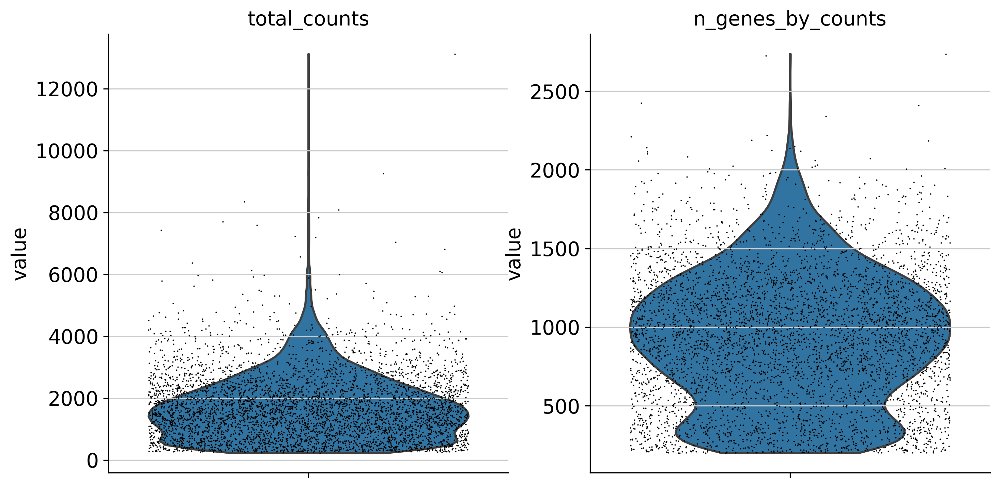

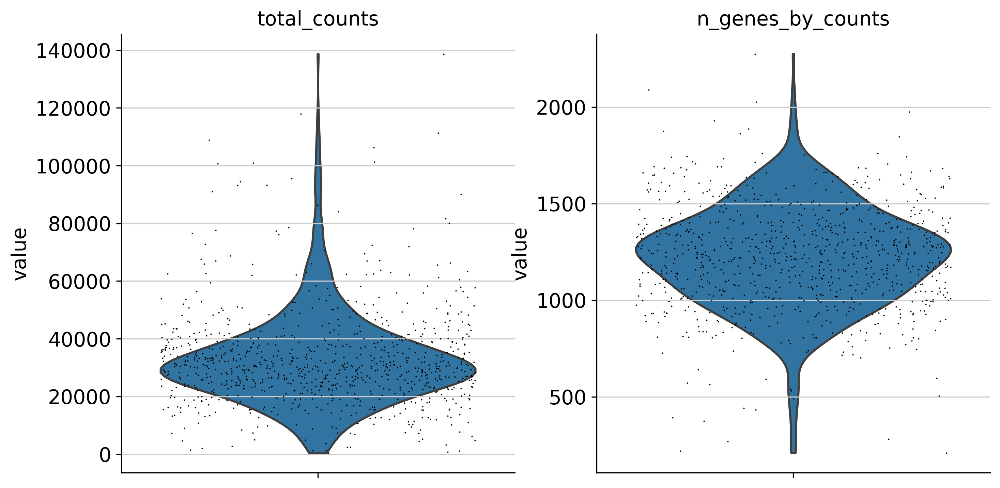

In [16]:
sc.pl.violin(ad_10x, keys = ['total_counts', 'n_genes_by_counts'], jitter=0.4, rotation= 45, multi_panel=True)
sc.pl.violin(ad_smart, keys = ['total_counts', 'n_genes_by_counts'], jitter=0.4, rotation= 45, multi_panel=True)

In [17]:
ad_smart.obs['batch'] = 'SS2'
ad_10x.obs['batch'] = '10X'

In [18]:
SS2 = ad_smart[ad_smart.obs["batch"] == "SS2", :]
tenx = ad_10x[ad_10x.obs["batch"] == "10X", :]
#adata2 = [ad_smart, ad_10x]

In [19]:
SS2.obs['sample'] = 'SS2'
tenx.obs['sample'] = '10X'

/scratch/29993432/ipykernel_25730/362186487.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  SS2.obs['sample'] = 'SS2'
/scratch/29993432/ipykernel_25730/362186487.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tenx.obs['sample'] = '10X'


In [20]:
adata = SS2.concatenate(tenx)

In [21]:
print(adata.X.shape)
adata = adata.raw.to_adata() 
print(adata.X[1:10,1:10])
adata

(5471, 4912)
  (0, 6)	1.0
  (0, 5)	24.0
  (0, 3)	21.0
  (0, 0)	17.0
  (1, 7)	2.0
  (1, 6)	12.0
  (1, 5)	3.0
  (1, 1)	7.0
  (2, 6)	1.0
  (2, 0)	25.0
  (3, 6)	2.0
  (3, 5)	17.0
  (5, 6)	8.0
  (5, 5)	1.0
  (6, 7)	2.0
  (6, 6)	4.0
  (6, 3)	37.0
  (6, 0)	3.0
  (7, 7)	1.0
  (8, 7)	3.0
  (8, 6)	1.0
  (8, 3)	1.0


AnnData object with n_obs × n_vars = 5471 × 4912
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_counts', 'S_score', 'G2M_score', 'phase', 'louvain_0.4', 'leiden_0.4', 'louvain_0.6', 'leiden_0.6', 'louvain_0.8', 'leiden_0.8', 'louvain_0.9', 'leiden_0.9', 'louvain_1.0', 'leiden_1.0', 'louvain_1.1', 'leiden_1.1', 'louvain_1.2', 'leiden_1.2', 'louvain_1.4', 'leiden_1.4', 'louvain_1.6', 'leiden_1.6', 'day', 'batch', 'sample'
    obsm: 'X_pca', 'X_umap'

In [22]:
# save normalized counts in raw slot.
adata.raw = adata

# normalize to depth 10000 UMIs per cell
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

# logaritmize
sc.pp.log1p(adata)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [23]:
# compute variable genes
sc.pp.highly_variable_genes(
    adata, n_top_genes=4000,
    inplace=True, batch_key="sample")
print("Highly variable genes: %d"%sum(adata.var.highly_variable))

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Highly variable genes: 4000


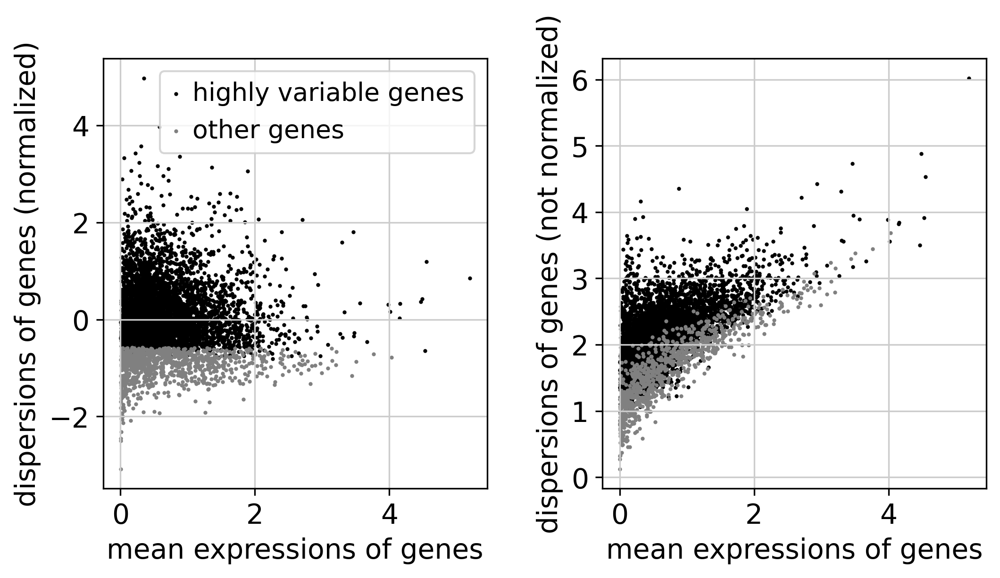

In [24]:
#plot variable genes
sc.pl.highly_variable_genes(adata)

# subset for variable genes in the dataset
#adata = adata[:, adata.var['highly_variable']]

In [25]:
batches = adata.obs['sample'].cat.categories.tolist()
alldata = {}
for batch in batches:
    alldata[batch] = adata[adata.obs['sample'] == batch,]

alldata

{'10X': View of AnnData object with n_obs × n_vars = 4555 × 4912
     obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_counts', 'S_score', 'G2M_score', 'phase', 'louvain_0.4', 'leiden_0.4', 'louvain_0.6', 'leiden_0.6', 'louvain_0.8', 'leiden_0.8', 'louvain_0.9', 'leiden_0.9', 'louvain_1.0', 'leiden_1.0', 'louvain_1.1', 'leiden_1.1', 'louvain_1.2', 'leiden_1.2', 'louvain_1.4', 'leiden_1.4', 'louvain_1.6', 'leiden_1.6', 'day', 'batch', 'sample'
     var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
     uns: 'log1p', 'hvg'
     obsm: 'X_pca', 'X_umap',
 'SS2': View of AnnData object with n_obs × n_vars = 916 × 4912
     obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_counts', '

In [40]:
adatas = list(alldata.values())

In [41]:
corr_data = scanorama.correct_scanpy(adatas, return_dimred=True)

Found 4912 genes among all datasets
[[0.         0.54694323]
 [0.         0.        ]]
Processing datasets (0, 1)


In [15]:
#adata_all = sc.concat(
#    corr_data,
#    label="batch",
#    uns_merge="unique",
#    keys=["SS2", "10X"],
    
#)


In [42]:
scanorama.integrate_scanpy(
    adatas        = corr_data,
    dimred        = 50)

Found 4912 genes among all datasets
[[0.         0.68886463]
 [0.         0.        ]]
Processing datasets (0, 1)


In [48]:
corr_data[1].obsm['X_scanorama'].shape

(916, 50)

In [49]:
# Get all the integrated matrices.
scanorama_int = [ad.obsm['X_scanorama'] for ad in corr_data]

# make into one matrix.
all_s = np.concatenate(scanorama_int)
print(all_s.shape)

# add to the AnnData object
adata.obsm["scanorama"] = all_s

(5471, 50)


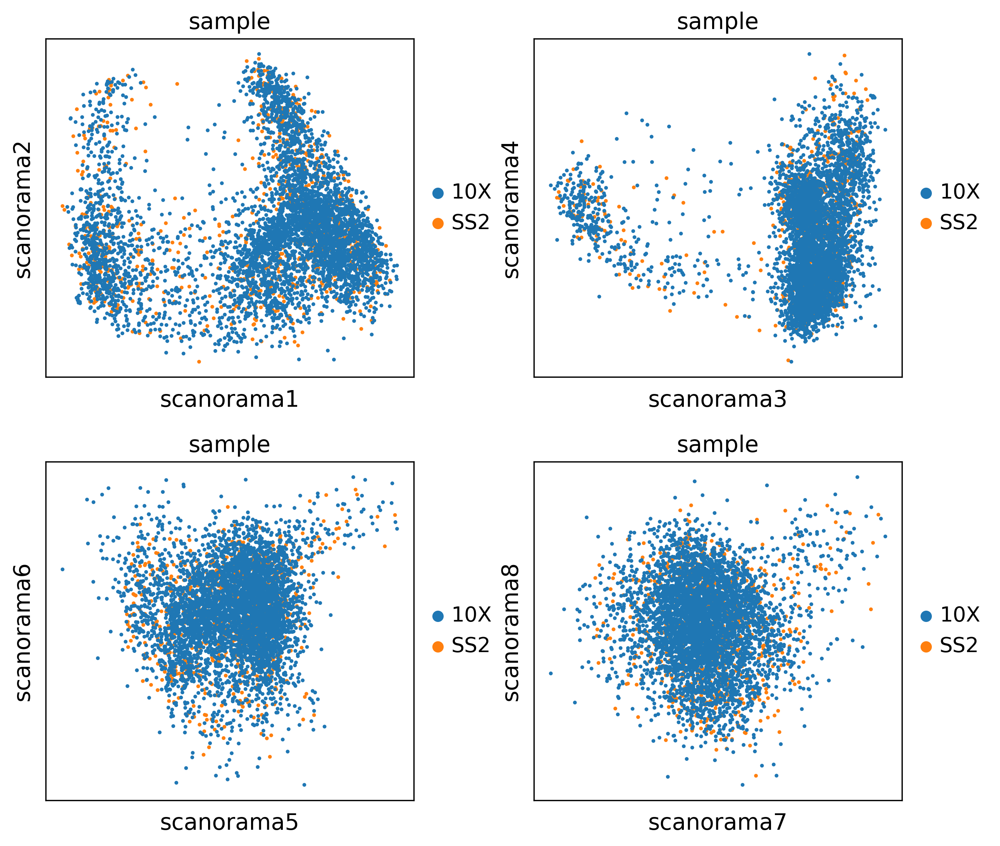

In [50]:
sc.pl.embedding(
    basis='scanorama',
    adata = adata,
    color='sample', 
    components = ['1,2','3,4','5,6','7,8'], 
    ncols=2)

In [26]:
#sc.pl.pca_variance_ratio(adata, log=True)

In [53]:
sc.pp.neighbors(adata, n_pcs = 10, n_neighbors = 10 ,use_rep="scanorama")
sc.tl.umap(adata,n_components= 20, min_dist=0.6,spread=0.6,maxiter=150)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


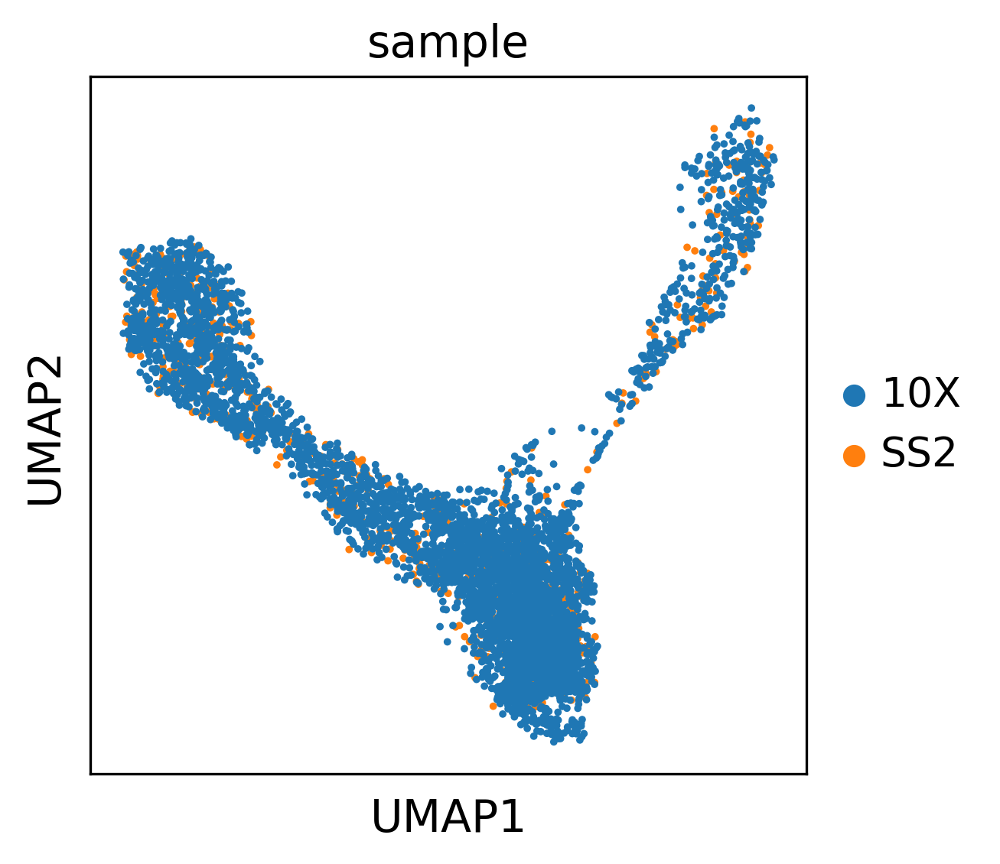

In [56]:
sc.pl.umap(adata, color='sample')

In [46]:
resolutions = [0.4,0.6,0.8,0.9,1.0,1.1,1.2,1.4,1.6]

In [47]:
for i in resolutions:
    sc.tl.louvain( adata, resolution = i, key_added = "louvain_"+str(i) )
    sc.tl.leiden(  adata, resolution = i, key_added = "leiden_"+str(i) )

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 11 clusters and added
    'louvain_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 13 clusters and added
    'louvain_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 16 clusters and added
    'louvain_0.8', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 18 clusters and added
    'leiden_0.8', the cluster labels (adata.obs, categorical) (0:00:00)
running Lo

In [22]:
all_clusterings = [ ('louvain_'+str(i)) for i in resolutions] + [ ('leiden_'+str(i)) for i in resolutions ]

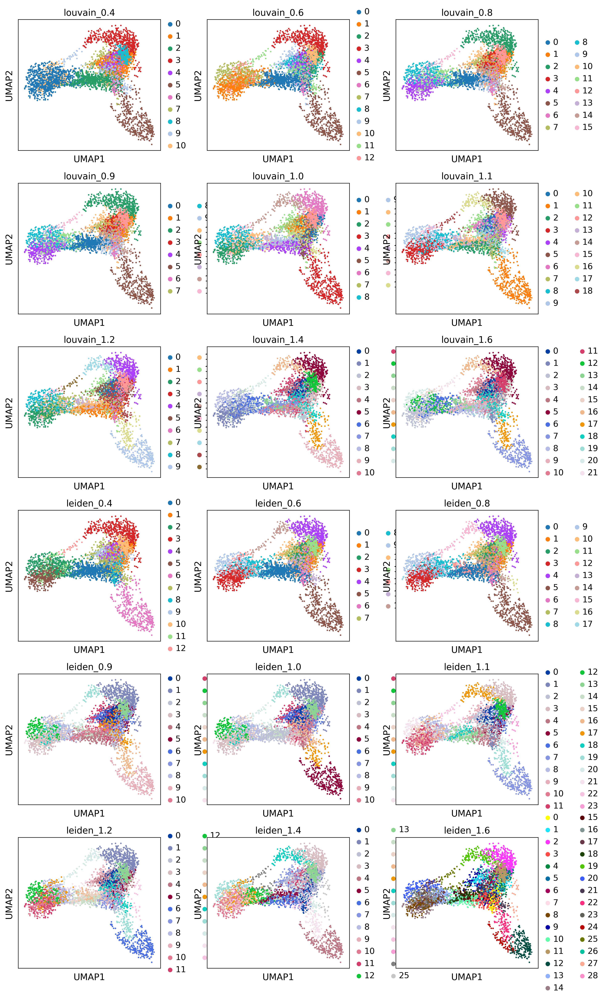

In [23]:
sc.pl.umap(adata = adata, color=all_clusterings , ncols=3 )

In [39]:
# split per batch into new objects.
#cdata = sc.external.pp.mnn_correct(alldata, batch_key="sample", save_raw = True, var_subset = var_genes_all)

In [47]:
# the variable genes defined are used by default by the pca function, 
# now we want to run on all the genes in the data



In [ ]:
#corr_data = scanorama.correct_scanpy(adata, return_dimred=True)

Found 4912 genes among all datasets


In [85]:
ad_smart.var_names_make_unique()
ad_10x.var_names_make_unique()
sc.pp.calculate_qc_metrics(ad_smart, inplace=True)
sc.pp.calculate_qc_metrics(ad_10x, inplace=True)


/home/mubasher/.local/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/mubasher/.local/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [87]:

    #sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000, inplace=True)

normalizing by total count per cell
filtered out 431 cells that have less than 1 counts
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell
filtered out 2036 cells that have less than 1 counts


/home/mubasher/.conda/envs/spatial/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:352: RuntimeWarning: invalid value encountered in log1p
  np.log1p(X, out=X)


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


/home/mubasher/.conda/envs/spatial/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:352: RuntimeWarning: invalid value encountered in log1p
  np.log1p(X, out=X)


In [190]:
#adatas = [ad_smart, ad_10x]
#adatas
#adatas_cor = scanorama.correct_scanpy(corr_data, return_dimred=True)

Found 4912 genes among all datasets
[[0.         0.91812227]
 [0.         0.        ]]
Processing datasets (0, 1)


/home/mubasher/.conda/envs/spatial/lib/python3.9/site-packages/scanorama/scanorama.py:237: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = AnnData(datasets[i])


In [191]:
#adatas_cor

[AnnData object with n_obs × n_vars = 916 × 4912
     obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_counts', 'S_score', 'G2M_score', 'phase', 'louvain_0.4', 'leiden_0.4', 'louvain_0.6', 'leiden_0.6', 'louvain_0.8', 'leiden_0.8', 'louvain_0.9', 'leiden_0.9', 'louvain_1.0', 'leiden_1.0', 'louvain_1.1', 'leiden_1.1', 'louvain_1.2', 'leiden_1.2', 'louvain_1.4', 'leiden_1.4', 'louvain_1.6', 'leiden_1.6', 'day', 'batch', 'sample'
     var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'ribo', 'hb', 'mal_rna', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
     uns: 'day_colors', 'hvg', 'leiden', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_0.8_colors', 'leiden_0.9_colors', 'leiden_1.0_colors', 'leiden_1.1_colors', 'leiden_1.2_colors', 'leiden_1.4_colors', 'leiden_1.6_colors', 'log1p', 'louv

In [192]:
#scanorama.integrate_scanpy(
 #   adatas        = adatas_cor,
 #   dimred        = 50)

Found 4912 genes among all datasets
[[0.         0.96179039]
 [0.         0.        ]]
Processing datasets (0, 1)


In [193]:
#adatas_cor

[AnnData object with n_obs × n_vars = 916 × 4912
     obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_counts', 'S_score', 'G2M_score', 'phase', 'louvain_0.4', 'leiden_0.4', 'louvain_0.6', 'leiden_0.6', 'louvain_0.8', 'leiden_0.8', 'louvain_0.9', 'leiden_0.9', 'louvain_1.0', 'leiden_1.0', 'louvain_1.1', 'leiden_1.1', 'louvain_1.2', 'leiden_1.2', 'louvain_1.4', 'leiden_1.4', 'louvain_1.6', 'leiden_1.6', 'day', 'batch', 'sample'
     var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'ribo', 'hb', 'mal_rna', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
     uns: 'day_colors', 'hvg', 'leiden', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_0.8_colors', 'leiden_0.9_colors', 'leiden_1.0_colors', 'leiden_1.1_colors', 'leiden_1.2_colors', 'leiden_1.4_colors', 'leiden_1.6_colors', 'log1p', 'louv

In [ ]:
#adata_all
# Get all the integrated matrices.
scanorama_int = [ad.obsm['X_scanorama'] for ad in adata_all]

# make into one matrix.
all_s = np.concatenate(scanorama_int)
print(all_s.shape)

# add to the AnnData object
adata_all.obsm["scanorama"] = all_s

In [50]:
adata_all = sc.concat(
    corr_data,
    label="batch",
    uns_merge="unique",
    keys=["SS2", "10X"],
    
)

In [51]:
adata_all

AnnData object with n_obs × n_vars = 5471 × 4912
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_counts', 'S_score', 'G2M_score', 'phase', 'louvain_0.4', 'leiden_0.4', 'louvain_0.6', 'leiden_0.6', 'louvain_0.8', 'leiden_0.8', 'louvain_0.9', 'leiden_0.9', 'louvain_1.0', 'leiden_1.0', 'louvain_1.1', 'leiden_1.1', 'louvain_1.2', 'leiden_1.2', 'louvain_1.4', 'leiden_1.4', 'louvain_1.6', 'leiden_1.6', 'day', 'batch', 'sample'
    uns: 'log1p', 'hvg'
    obsm: 'X_pca', 'X_umap', 'X_scanorama'

In [59]:
#adata_all
# Get all the integrated matrices.
scanorama_int = [ad.obsm['X_scanorama'] for ad in adata_all]

# make into one matrix.
all_s = np.concatenate(scanorama_int)
print(all_s.shape)

# add to the AnnData object
adata_all.obsm["scanorama"] = all_s

(5471, 50)


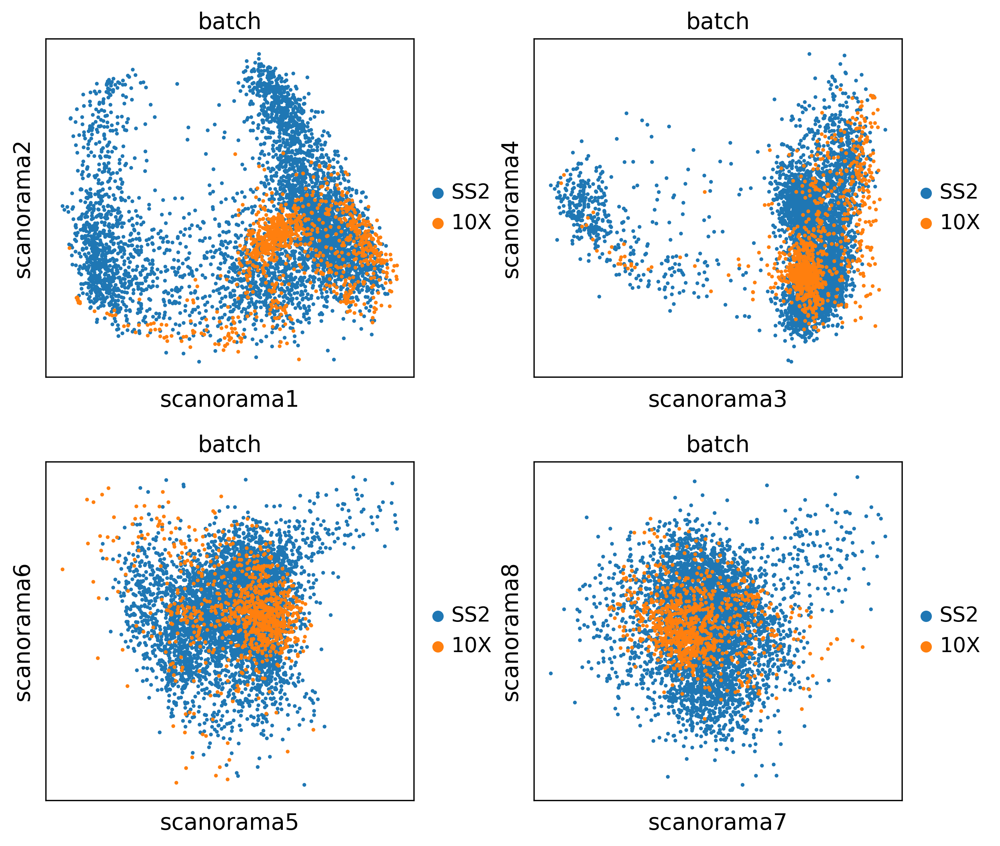

AnnData object with n_obs × n_vars = 5471 × 4912
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_counts', 'S_score', 'G2M_score', 'phase', 'louvain_0.4', 'leiden_0.4', 'louvain_0.6', 'leiden_0.6', 'louvain_0.8', 'leiden_0.8', 'louvain_0.9', 'leiden_0.9', 'louvain_1.0', 'leiden_1.0', 'louvain_1.1', 'leiden_1.1', 'louvain_1.2', 'leiden_1.2', 'louvain_1.4', 'leiden_1.4', 'louvain_1.6', 'leiden_1.6', 'day', 'batch', 'sample'
    uns: 'log1p', 'hvg', 'batch_colors'
    obsm: 'X_pca', 'X_umap', 'X_scanorama'

In [52]:
sc.pl.embedding(
    basis='scanorama',
    adata = adata_all,
    color='batch', 
    components = ['1,2','3,4','5,6','7,8'], 
    ncols=2)

adata_all

In [61]:
#sc.tl.pca(adata_all, svd_solver = 'arpack', use_highly_variable = False)
#sc.pl.pca(adata_all, components = ['1,2','3,4','5,6','7,8'], ncols=2, color='batch')
#sc.pl.pca_variance_ratio(adata_all, log=True)

In [62]:
adata_all
#print(adata_all.X.shape)
#print(adata_all.raw.X.shape)
#print(adata_all.raw.X[:10,:15])

AnnData object with n_obs × n_vars = 5471 × 4912
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_counts', 'S_score', 'G2M_score', 'phase', 'louvain_0.4', 'leiden_0.4', 'louvain_0.6', 'leiden_0.6', 'louvain_0.8', 'leiden_0.8', 'louvain_0.9', 'leiden_0.9', 'louvain_1.0', 'leiden_1.0', 'louvain_1.1', 'leiden_1.1', 'louvain_1.2', 'leiden_1.2', 'louvain_1.4', 'leiden_1.4', 'louvain_1.6', 'leiden_1.6', 'batch', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'
    uns: 'day_colors', 'hvg', 'leiden', 'louvain', 'neighbors', 'pca', 'umap', 'batch_colors'
    obsm: 'X_pca', 'X_umap', 'X_scanorama', 'scanorama'

In [53]:
sc.pp.neighbors(adata_all, n_pcs = 10, n_neighbors = 10 ,use_rep="X_scanorama")
sc.tl.umap(adata_all,n_components= 20, min_dist=1,spread=0.6,maxiter=150)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


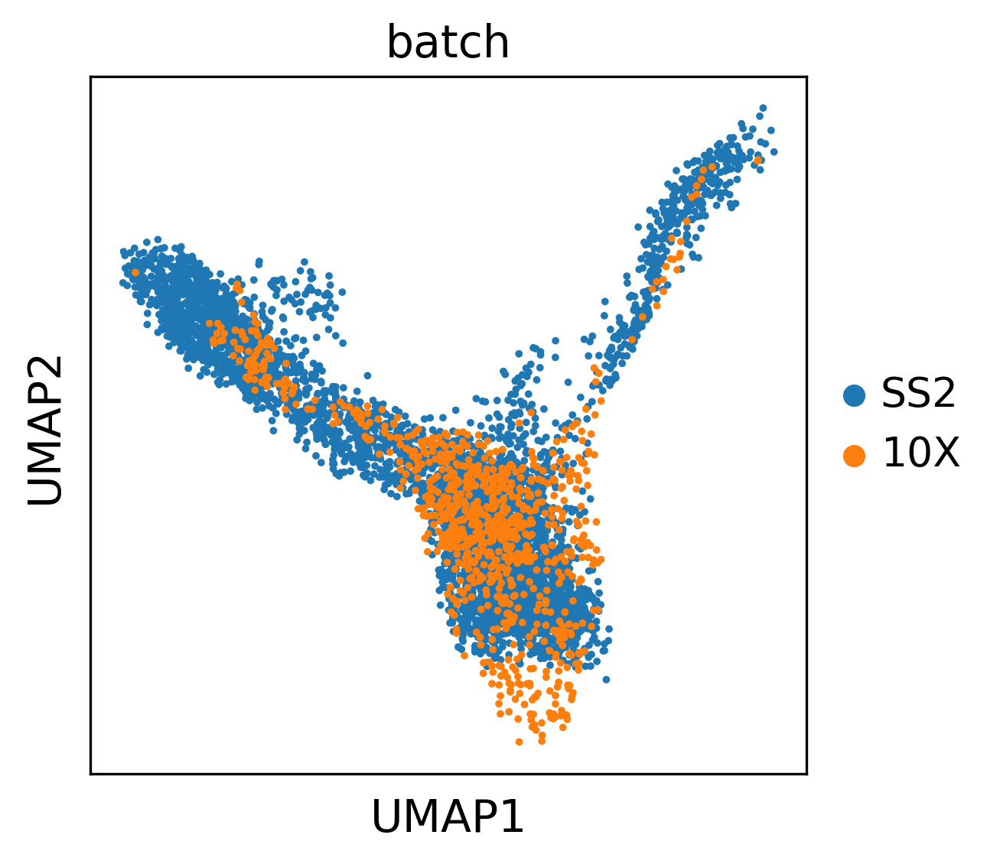

In [63]:
sc.pl.umap(adata_all, color='batch', projection = '2d')

In [55]:
resolutions = [0.4,0.6,0.8,0.9,1.0,1.1,1.2,1.4,1.6]

In [56]:
for i in resolutions:
    sc.tl.louvain( adata_all, resolution = i, key_added = "louvain_"+str(i) )
    sc.tl.leiden(  adata_all, resolution = i, key_added = "leiden_"+str(i) )

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 10 clusters and added
    'louvain_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 12 clusters and added
    'louvain_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 13 clusters and added
    'louvain_0.8', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 17 clusters and added
    'leiden_0.8', the cluster labels (adata.obs, categorical) (0:00:00)
running Lo

In [58]:
all_clusterings = [ ('louvain_'+str(i)) for i in resolutions] + [ ('leiden_'+str(i)) for i in resolutions ]

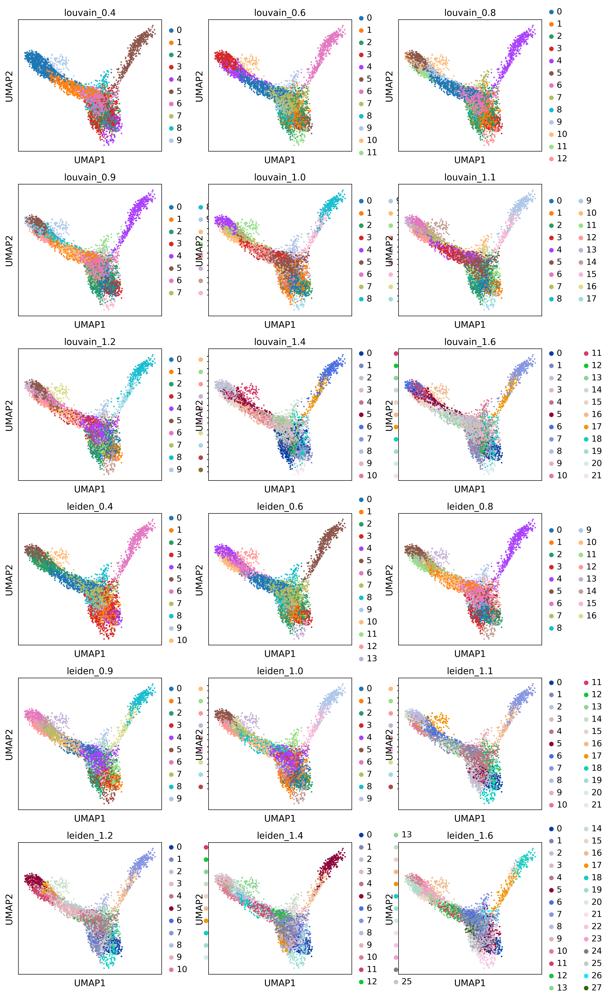

In [59]:
sc.pl.umap(adata = adata_all, color=all_clusterings , ncols=3 )

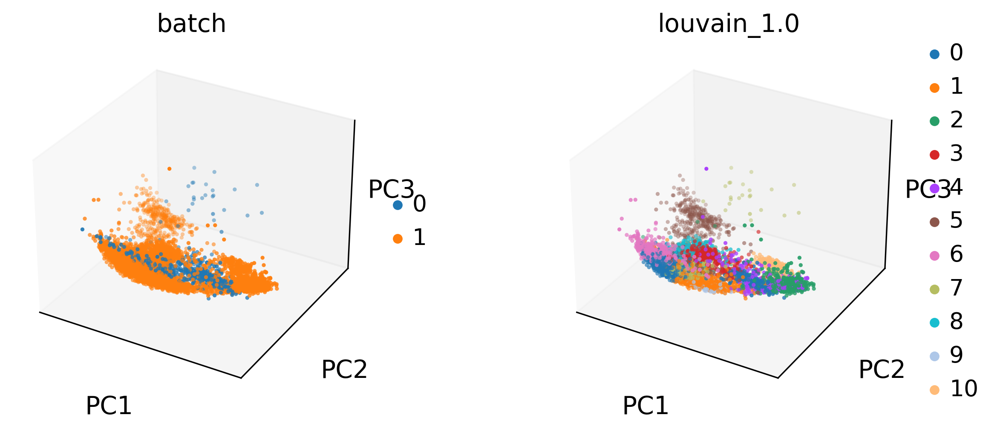

In [38]:
sc.pl.pca(adata, ncols=2, color=['batch', 'louvain_1.0'], projection = '3d')

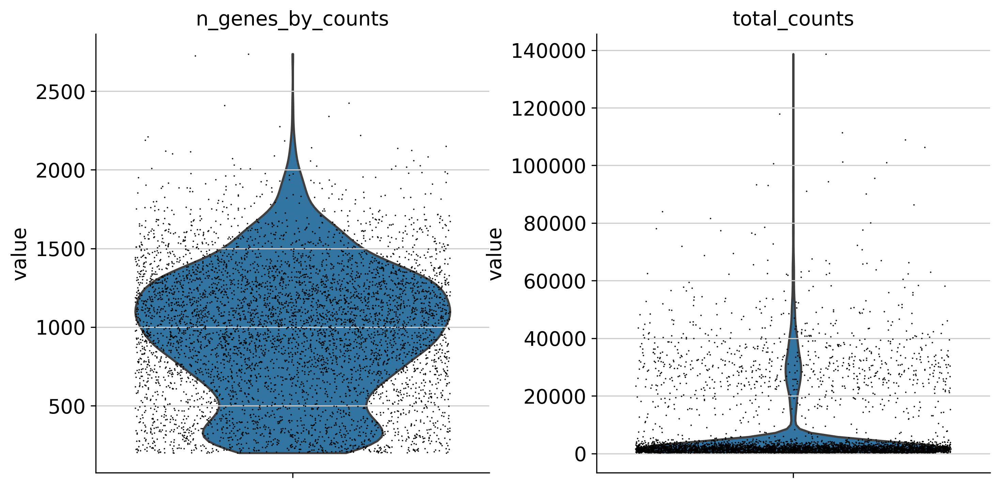

In [57]:
variables = ['n_genes_by_counts', 'total_counts']
sc.pl.violin(adata, keys=variables, jitter=0.4, rotation= 45, multi_panel=True)

In [63]:
adata.obs_names = [i.replace('-1-1', '') for i in adata.obs_names]
#ldata_10x.obs_names = [i.replace('x', '') for i in ldata_10x.obs_names]

adata.obs_names_make_unique()
adata.obs_names
adata.obs_names

Index(['A10_R1.17_532', 'A10_R1.18_360', 'A10_R1.18_361', 'A11_R1.17_532',
       'A11_R1.18_360', 'A11_R1.18_361', 'A12_R1.17_532', 'A12_R1.18_360',
       'A12_R1.18_361', 'A13_R1.17_532',
       ...
       'TTTGGTTCATACTGTG', 'TTTGGTTGTAGCTTGT', 'TTTGTTGAGCACTGGA',
       'TTTGTTGAGCCTCATA', 'TTTGTTGCAGCTGTAT', 'TTTGTTGGTAAGGCTG',
       'TTTGTTGGTCGGTGTC', 'TTTGTTGGTCGTGGTC', 'TTTGTTGGTGAGTTGG',
       'TTTGTTGTCGAAGCAG'],
      dtype='object', length=5471)

In [65]:
adata.var_names

Index(['PF3D7_1401100', 'PF3D7_1401300', 'PF3D7_1401400', 'PF3D7_1401500',
       'PF3D7_1401600', 'PF3D7_1401700', 'PF3D7_1401800', 'PF3D7_1401900',
       'PF3D7_1402000', 'PF3D7_1402100',
       ...
       'PF3D7_0113400', 'PF3D7_0113700', 'PF3D7_0113800', 'PF3D7_0113900',
       'PF3D7_0114000', 'PF3D7_0114500', 'PF3D7_0115000', 'PF3D7_0115100',
       'PF3D7_0115600', 'PF3D7_0115700'],
      dtype='object', length=4912)

In [66]:
os.makedirs('../results/single_cell', exist_ok=True)
adata.write_h5ad('../results/single_cell/integrated_dataset_SS2_10X.h5ad')

In [30]:
#os.makedirs('../results/single_cell', exist_ok=True)
#ad_smart.write_h5ad('../results/single_cell/single_cell_smartseq2_qc.h5ad')

In [67]:
adata = sc.read_h5ad('../results/single_cell/integrated_dataset_SS2_10X.h5ad')

In [27]:
#meta_data = int_adata.obs.copy()
#meta_data.to_csv("../files/meta.data_int.csv", sep=";")
#mtx =int_adata.raw.toarray()
ad_10x

AnnData object with n_obs × n_vars = 4555 × 5019
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'S_score', 'G2M_score', 'phase', 'louvain_0.4', 'leiden_0.4', 'louvain_0.6', 'leiden_0.6', 'louvain_0.8', 'leiden_0.8', 'louvain_0.9', 'leiden_0.9', 'louvain_1.0', 'leiden_1.0', 'louvain_1.1', 'leiden_1.1', 'louvain_1.2', 'leiden_1.2', 'louvain_1.4', 'leiden_1.4', 'louvain_1.6', 'leiden_1.6'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_0.8_colors', 'leiden_0.9_colors', 'leiden_1.0_colors', 'leiden_1.1_colors', 'leiden_1.2_colors', 'leiden_1.4_colors', 'leiden_1.6_colors', 'log1p', 'louvain', 'louvain_0.4_colors', 'louvain_0.6_colors', 'louvain_0.8_

In [ ]:
adata.T.to_df().to_csv('../files/filtered_matrix_integrated_set.tsv')

In [61]:
adata.obs_names

Index(['A10_R1.17_532-0', 'A10_R1.18_360-0', 'A10_R1.18_361-0',
       'A11_R1.17_532-0', 'A11_R1.18_360-0', 'A11_R1.18_361-0',
       'A12_R1.17_532-0', 'A12_R1.18_360-0', 'A12_R1.18_361-0',
       'A13_R1.17_532-0',
       ...
       'TTTGGTTCATACTGTG-1-1', 'TTTGGTTGTAGCTTGT-1-1', 'TTTGTTGAGCACTGGA-1-1',
       'TTTGTTGAGCCTCATA-1-1', 'TTTGTTGCAGCTGTAT-1-1', 'TTTGTTGGTAAGGCTG-1-1',
       'TTTGTTGGTCGGTGTC-1-1', 'TTTGTTGGTCGTGGTC-1-1', 'TTTGTTGGTGAGTTGG-1-1',
       'TTTGTTGTCGAAGCAG-1-1'],
      dtype='object', length=5471)

In [59]:
adata.raw = adata

In [22]:
#print(ad_10x.layers['raw_counts'][:10,:15])
#print(ad_smart.layers['raw_counts'][:10,:15])
ad_smart = ad_smart.raw.to_adata()
sc.pp.normalize_per_cell(ad_smart, counts_per_cell_after=1e4)
sc.pp.log1p(ad_smart)
sc.pp.scale(ad_smart)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


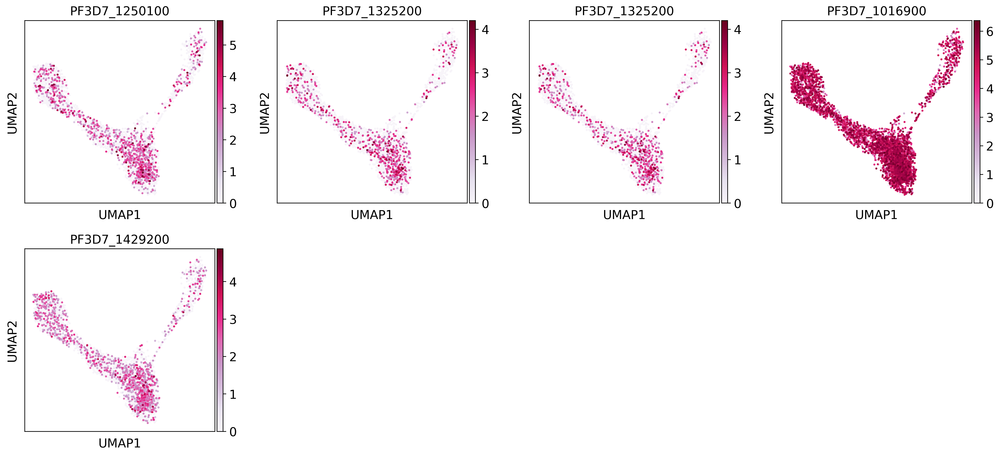

In [60]:
genes = ["PF3D7_1250100", "PF3D7_1325200", "PF3D7_1325200", "PF3D7_1016900", "PF3D7_1429200"]
sc.pl.umap(adata, color = genes, cmap="PuRd")